In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import glob
import os
import pandas_profiling
import missingno
import seaborn as sns
from matplotlib import pyplot as plt
from pandas import scatter_matrix
from Preprocessing import Preprocessing
from Preprocessing import Cols
from pandas import DataFrame
import numpy as np
import plotly.offline as py
from plotly.offline import init_notebook_mode
import plotly.graph_objs as go
import plotly.figure_factory as ff
init_notebook_mode(connected=True)
import pandas
from sklearn.model_selection import train_test_split
from Preprocessing import Cols
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import learning_curve
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import MinMaxScaler

In [2]:
pre = Preprocessing()
X, y = pre.load_data(return_as_df=True)

prepared dataset contains: per_action_dataset + self.per_stud_dataset
There is no seq_ix column to remove!


## Creating required datasets

In [2]:
pre = Preprocessing()
X, y = pre.load_data(return_as_df=True, summarize=True)

prepared dataset contains: per_stud_dataset + per_action_dataset_summ


In [6]:
X_train, X_test, y_train,y_test = train_test_split(X,y, train_size=.80)

In [6]:
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=1, train_sizes=np.linspace(.1, 1.0, 5)):
    """
    Generate a simple plot of the test and training learning curve.

    Parameters
    ----------
    estimator : object type that implements the "fit" and "predict" methods
        An object of that type which is cloned for each validation.

    title : string
        Title for the chart.

    X : array-like, shape (n_samples, n_features)
        Training vector, where n_samples is the number of samples and
        n_features is the number of features.

    y : array-like, shape (n_samples) or (n_samples, n_features), optional
        Target relative to X for classification or regression;
        None for unsupervised learning.

    ylim : tuple, shape (ymin, ymax), optional
        Defines minimum and maximum yvalues plotted.

    cv : int, cross-validation generator or an iterable, optional
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:
          - None, to use the default 3-fold cross-validation,
          - integer, to specify the number of folds.
          - An object to be used as a cross-validation generator.
          - An iterable yielding train/test splits.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : integer, optional
        Number of jobs to run in parallel (default 1).
    """
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='roc_auc', shuffle=True)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

<module 'matplotlib.pyplot' from '/usr/lib/python3.6/site-packages/matplotlib/pyplot.py'>

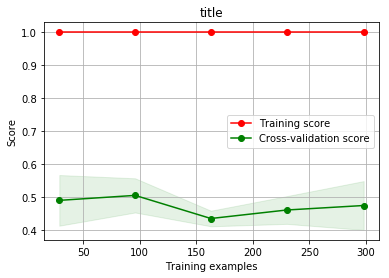

In [7]:
plot_learning_curve(estimator, "title", X_train, y_train, n_jobs=-1, cv=5)

In [8]:
from sklearn.model_selection import validation_curve

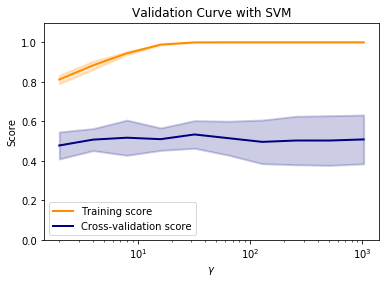

In [9]:
param_range = [2** i for i in range(1,11)]
train_scores, test_scores = validation_curve(
    estimator, X, y, param_name="model__n_estimators", param_range=param_range,
    cv=10, scoring="roc_auc", n_jobs=-1)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

plt.title("Validation Curve with SVM")
plt.xlabel("$\gamma$")
plt.ylabel("Score")
plt.ylim(0.0, 1.1)
lw = 2
plt.semilogx(param_range, train_scores_mean, label="Training score",
             color="darkorange", lw=lw)
plt.fill_between(param_range, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.2,
                 color="darkorange", lw=lw)
plt.semilogx(param_range, test_scores_mean, label="Cross-validation score",
             color="navy", lw=lw)
plt.fill_between(param_range, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.2,
                 color="navy", lw=lw)
plt.legend(loc="best")
plt.show()

## PCA Visualization

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3, whiten=True)
reduced_data = pca.fit_transform(X)

data = [
    go.Scatter3d(
        x = reduced_data[:,0], y = reduced_data[:,1], z= reduced_data[:,2], 
        mode='markers', marker={'size': 3, 'color':y.flatten() , 'colorscale':'Viridis', 'showscale':True})
]

layout = go.Layout(
    title='Dataset',
    autosize=True,
    margin=dict(l=65,r=50,b=65,t=90),
    scene=go.Scene(
        xaxis=dict(title="comp1"),
        yaxis=dict(title="comp2"),
        zaxis=dict(title="comp3"),
    )
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

## Scatter Matrix Visualization

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f6675850710>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7f666b54e518>]], dtype=object)

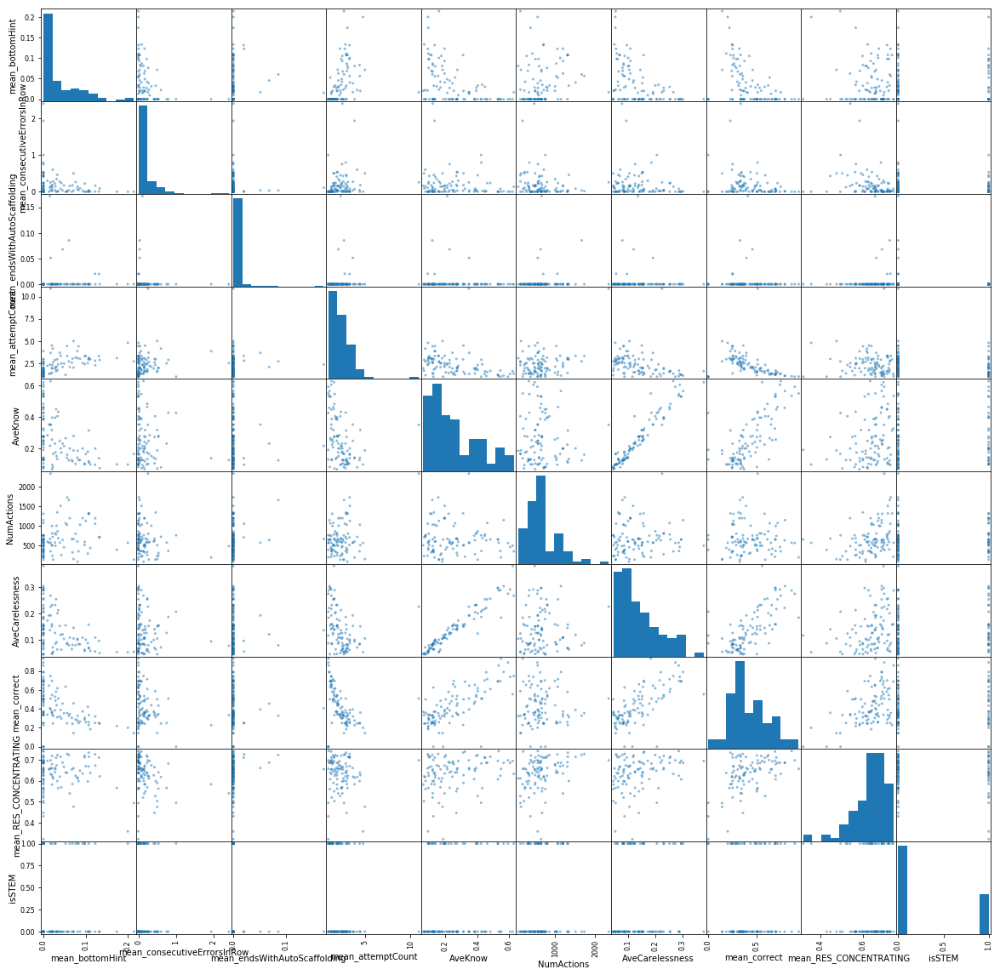

In [14]:
import pandas
labeled_X = X
labeled_X['isSTEM'] = y.flatten()
fig, ax = plt.subplots(figsize=(20, 20))
pandas.plotting.scatter_matrix(labeled_X[['mean_bottomHint','mean_consecutiveErrorsInRow','mean_endsWithAutoScaffolding','mean_attemptCount','AveKnow', 'NumActions', 'AveCarelessness', 'mean_correct', 'mean_RES_CONCENTRATING','isSTEM']]
                                 .sample(100), ax=ax, diagonal='hist')

## Violin plot for some of the features vs. target value

/usr/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


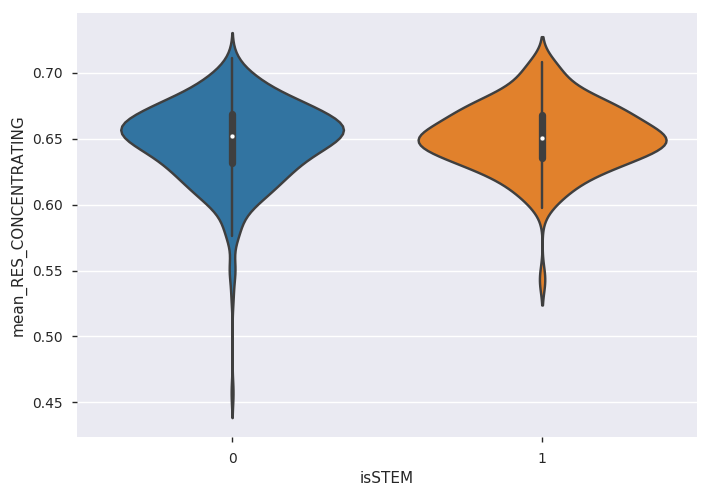

In [63]:
sns.violinplot('isSTEM','mean_RES_CONCENTRATING', data=labeled_X)

/usr/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


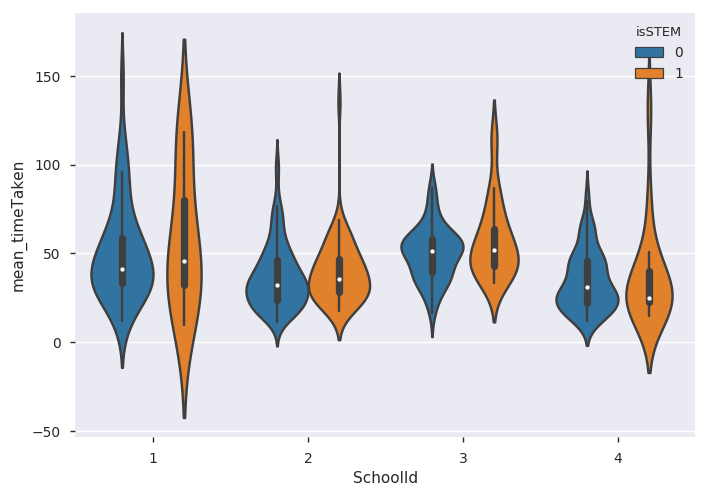

In [67]:
sns.violinplot('SchoolId','mean_timeTaken', hue='isSTEM', data=labeled_X)

/usr/lib/python3.6/site-packages/matplotlib/font_manager.py:1297: UserWarning: findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


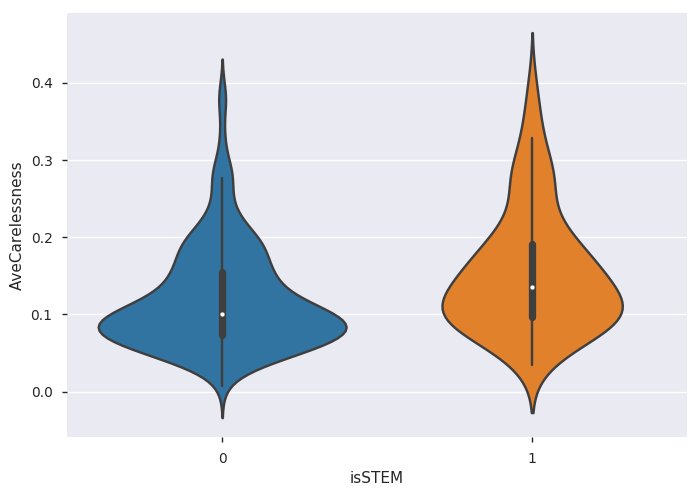

In [75]:
sns.violinplot('isSTEM','AveCarelessness', data=labeled_X)

## Big pairplot visualization for all "mean_" features

In [10]:
labeled_X = X
labeled_X['isSTEM'] = y.flatten()
selected_cols = X.columns[[col.startswith("mean_") or col in Cols.per_stud_cols for col in X.columns]]
pairplot = sns.pairplot(X[selected_cols], hue='isSTEM')
pairplot.savefig("output.png")

## Check summarization for a specific student

In [5]:
starts = X[X['ITEST_id'] == 676].min_startTime
s = DataFrame([np.repeat(1,len(starts)),pd.to_datetime(starts, unit='s')]).T
starts_raw = pre.raw_dataset[pre.raw_dataset['ITEST_id'] == 676].startTime
s_raw = DataFrame([np.repeat(2,len(starts_raw)),pd.to_datetime(starts_raw, unit='s')]).T

fig = {
    'data': [
  		{
  			'x': s[1], 
        	'y': s[0], 
        	'mode': 'markers',
            'name': 'summarized'
        },
        {
  			'x': s_raw[1], 
        	'y': s_raw[0], 
        	'mode': 'markers',
            'name': 'un-summarized'
        }
    ],
    'layout': {
        'xaxis': {'title': 'time'},
        'yaxis': {'title': "action"}
    }
}

py.iplot(fig)

## Dataset Profiling

In [3]:
pandas_profiling.ProfileReport(X)

Number of variables,194
Number of observations,467
Total Missing (%),0.0%
Total size in memory,696.9 KiB
Average record size in memory,1.5 KiB
Numeric,80
Categorical,0
Date,0
Text (Unique),0
Rejected,114
Correlation,0.95957


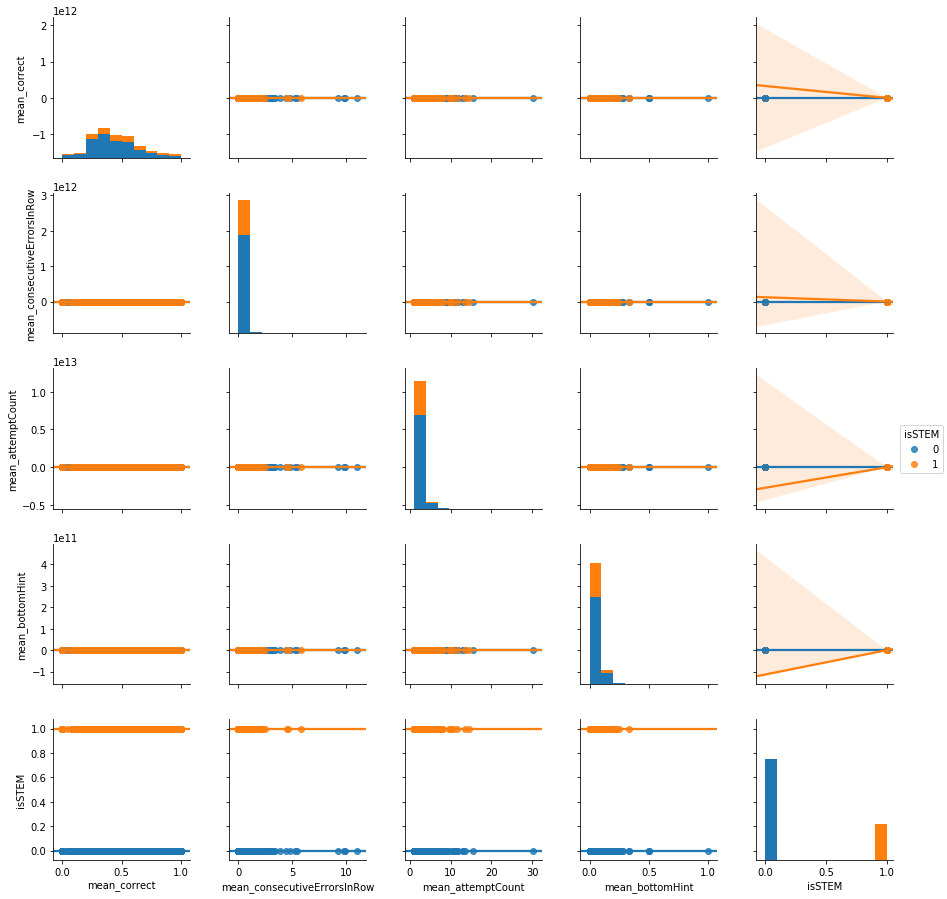

In [26]:
sns.pairplot(labeled_X[['mean_correct', 'mean_consecutiveErrorsInRow', 'mean_attemptCount', 'mean_bottomHint', 'isSTEM']],
             hue='isSTEM', diag_kind='hist', kind='reg')

In [ ]:
labeled_X = X
labeled_X['isSTEM'] = y.flatten()
df =labeled_X[['mean_correct', 'mean_consecutiveErrorsInRow', 'mean_attemptCount', 'mean_bottomHint', 'isSTEM']]
sns.kdeplot(df.x, df.y, ax=ax, )

## Feature Selecttion

In [15]:
scaler = MinMaxScaler()

scaled_features = scaler.fit_transform(X)

### Approach 1 (with chi2 and f_classif)

In [16]:
from sklearn.feature_selection import chi2, f_classif

selector_chimeasure = SelectKBest(chi2, k=10)
fit_chimeasure = selector_chimeasure.fit(scaled_features, y)

selector_fmeasure = SelectKBest(f_classif, k=10)
fit_fmeasure = selector_fmeasure.fit(scaled_features, y)

df = DataFrame({'score_chimeasure':fit_chimeasure.scores_, 'score_fmeasure':fit_fmeasure.scores_, 'feature':X.columns})

In [17]:
df.sort_values(by='score_chimeasure', inplace=True, ascending=False)
df

,feature,score_chimeasure,score_fmeasure
3,AveKnow,2.612693,19.314527
4,AveCarelessness,2.153747,20.811952
141,mean_hint,1.747531,16.344242
110,mean_timeGreater10SecAndNextActionRight,1.734463,17.742824
119,mean_bottomHint,1.599608,12.310366
143,mean_correct,1.452641,18.151016
111,mean_past8BottomOut,1.377466,7.826434
142,mean_manywrong,1.365963,17.680482
113,mean_hintCount,1.228072,13.196902
125,mean_hintTotal,1.108760,11.825135


In [21]:
selected_features = ['AveKnow', 'AveCarelessness', 'mean_hint', 'mean_timeGreater10SecAndNextActionRight', 'mean_bottomHint', 'mean_correct', 'mean_past8BottomOut','mean_manywrong', 'mean_hintCount','mean_hintTotal']

In [22]:
len(selected_features)

10

## Classification using selected features

In [4]:
estimator = Pipeline([
    ('model', GradientBoostingClassifier())
])

In [5]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from Preprocessing import Preprocessing
from pandas import DataFrame
from sklearn.metrics import roc_auc_score
from sklearn.metrics import mean_squared_error

# search spaces for different model classes
gbrt = {
    'model': [GradientBoostingClassifier()],
    'model__n_estimators': [2 ** i for i in range(1, 11)],
    'model__learning_rate': [2 ** i for i in range(-10, 10)],
}

svc = {
    'model': [SVC()],
    'model__C': [10 ** i for i in np.linspace(-6, 6, 20)],
    'model__gamma': [10 ** i for i in np.linspace(-6, 6, 20)],
}

linsvc = {
    'model': [LinearSVC(max_iter=10000)],
    'model__C': [10 ** i for i in np.linspace(-6, 6, 20)],
}

knn = {
    'model': [KNeighborsClassifier()],
    'model__n_neighbors': range(1, 44),
}
dectree = {
    'model': [DecisionTreeClassifier()],
    'model__max_depth': range(1, 20),
    'model__min_samples_split': [2 ** i for i in range(-20, -1)],
}

In [6]:
from sklearn.model_selection import StratifiedKFold
# this class does search over all parameter spaces for parameter
# combination which yields the best validation loss
model = GridSearchCV(
    estimator=estimator,
    param_grid=[gbrt, linsvc, knn, dectree],
    n_jobs=-1,
    scoring='roc_auc',
    verbose=1,
    cv=StratifiedKFold(5),
    iid=False
    
)

In [ ]:
from sklearn.feature_selection import chi2, f_classif

for i in [2**j for j in range(1,7)]:
    selector_chimeasure = SelectKBest(chi2, k=i)
    fit_chimeasure = selector_chimeasure.fit(scaled_features, y)

    selector_fmeasure = SelectKBest(f_classif, k=i)
    fit_fmeasure = selector_fmeasure.fit(scaled_features, y)
    
    X_train_fmeasure, X_test_fmeasure, y_train_fmeasure,y_test_fmeasure = train_test_split(selector_fmeasure.transform(X),y, train_size=.80)
    X_train_chimeasure, X_test_chimeasure, y_train_chimeasure,y_test_chimeasure = train_test_split(selector_chimeasure.transform(X),y, train_size=.80)
    
    fit_chimeasure = model.fit(X_train_chimeasure, y_train_chimeasure)
    fit_fmeasure = model.fit(X_train_fmeasure,y_train_fmeasure)
    test_score_chimeasure = model.score(X_test_chimeasure, y_test_chimeasure)
    test_score_fmeasure = model.score(X_test_fmeasure, y_test_fmeasure)
    
    print("test_score_chimeasure ( i= %d ): %f " % (i, test_score_chimeasure))
    print("test_score_fmeasure ( i= %d ): %f" % (i, test_score_fmeasure))
    print("Best parameters: %s" % model.best_params_)
    print("Model score: %s" % model.best_score_)
    print("####################")